# Waldemar Chang - Assignment 4: Constructing the Inference Service
## EN.705.603.82.FA24 Creating AI-Enabled Systems
#### Task 4
Using a notebook called inference_demo.ipynb. Demonstrate the following functions applied to five images by displaying the outputs:

- `inference.object_detection.predict()`
    - Show bounding box predictions overlaid over five images.

Output layer names: ('yolo_30', 'yolo_37')
Output layer names: ('yolo_30', 'yolo_37')
Inference time elapsed: 0.39 seconds


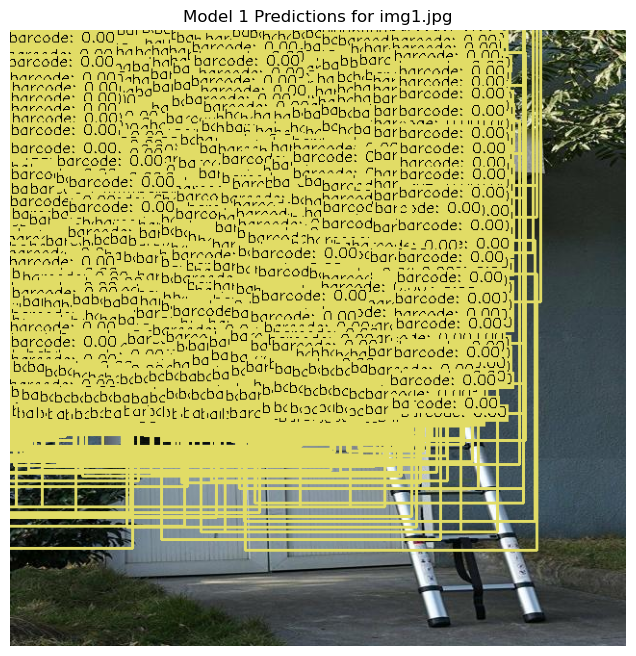

Inference time elapsed: 0.24 seconds


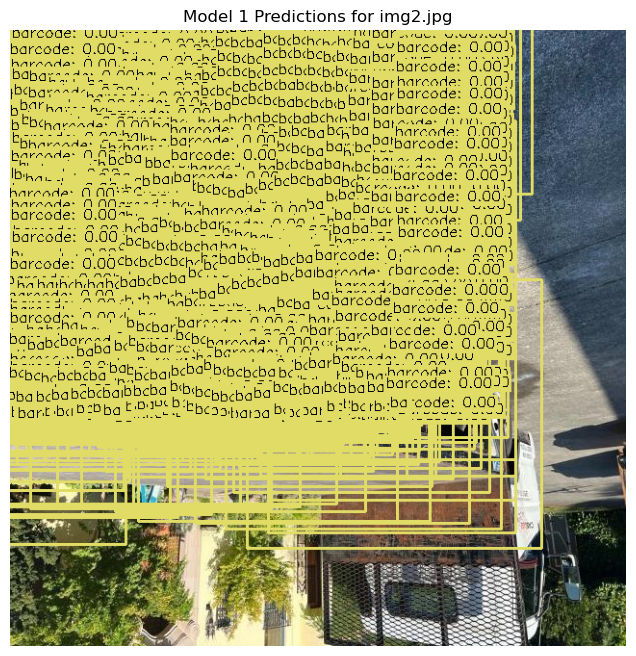

Inference time elapsed: 0.11 seconds


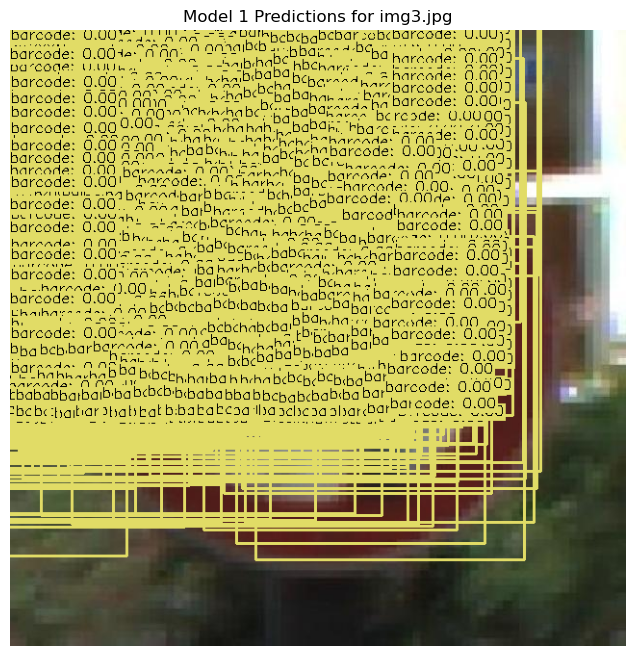

Inference time elapsed: 0.10 seconds


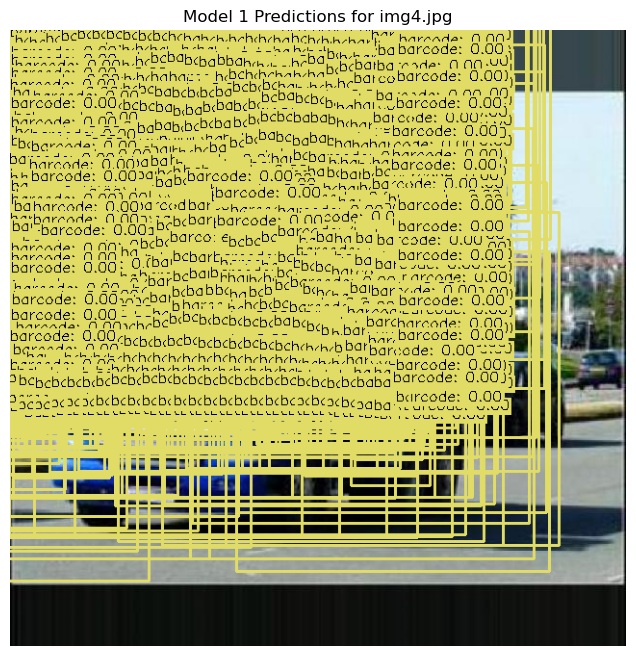

Inference time elapsed: 0.15 seconds


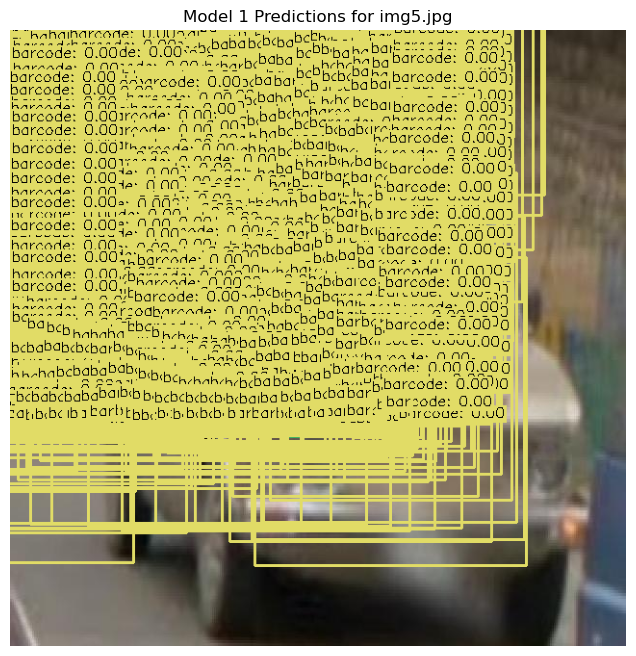

Inference time elapsed: 0.30 seconds


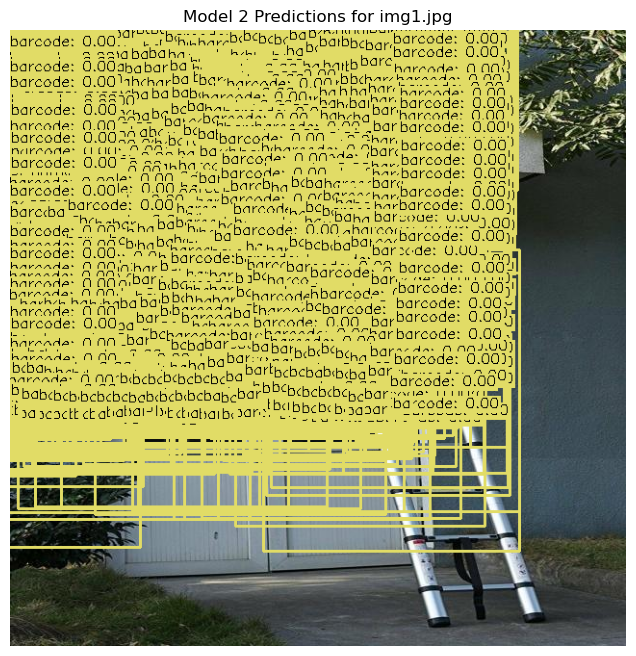

Inference time elapsed: 0.11 seconds


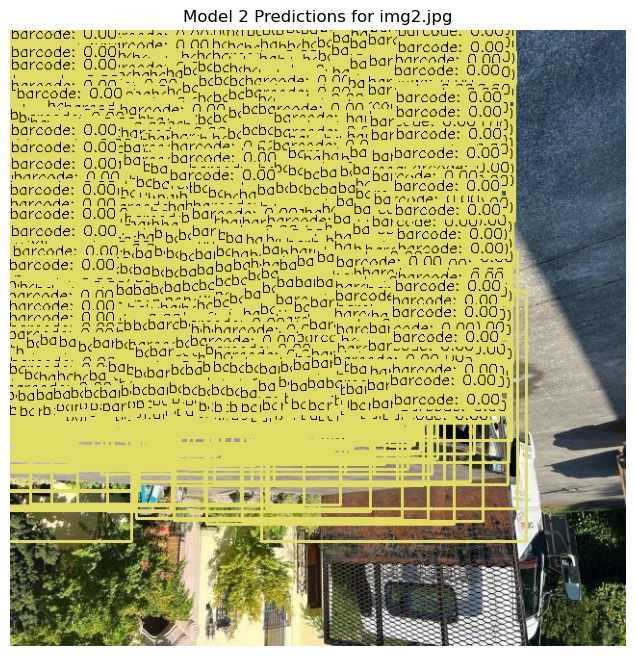

Inference time elapsed: 0.13 seconds


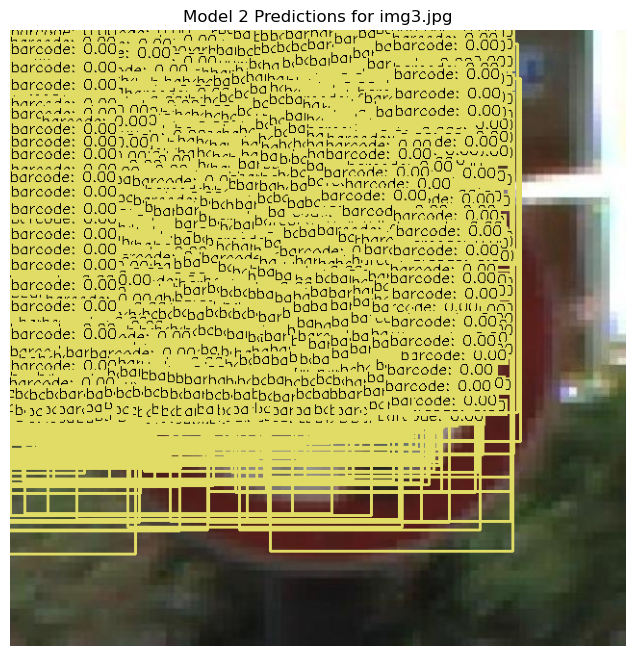

Inference time elapsed: 0.12 seconds


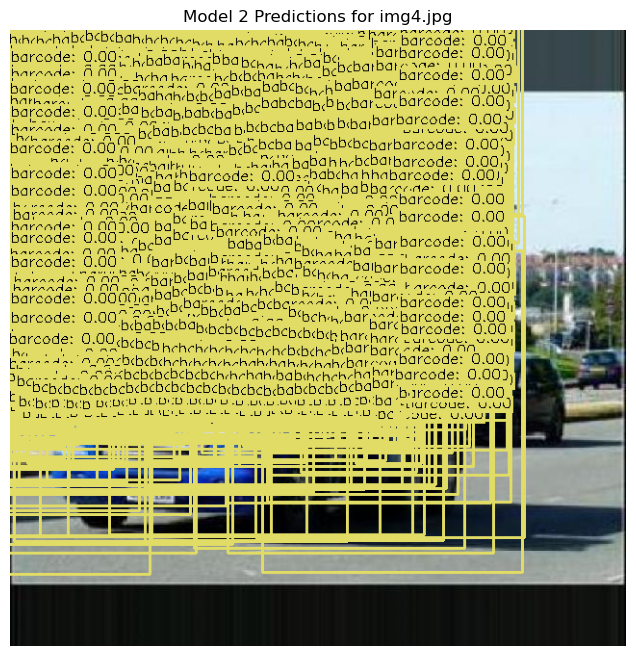

Inference time elapsed: 0.13 seconds


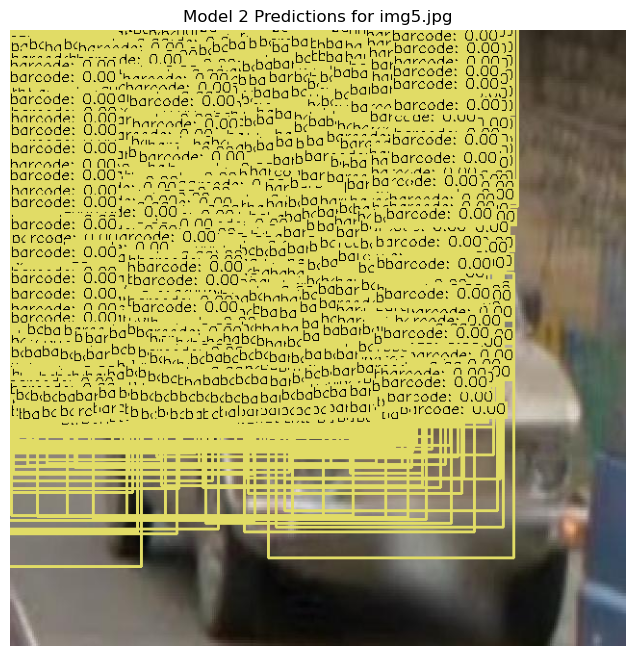

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
from object_detection import Model
from nms import filter

# Initialize models
model1 = Model('model1.cfg', 'model1.weights')
model2 = Model('model2.cfg', 'model2.weights')
models = [model1, model2]

# List of images to process
images = ['img1.jpg', 'img2.jpg', 'img3.jpg', 'img4.jpg', 'img5.jpg']

# Loop through models and images
for i, model in enumerate(models, start=1):
    for image_path in images:
        # Read the image
        image = cv.imread(image_path)
    
        # Check if the image is loaded successfully
        if image is None:
            print(f'Error loading image: {image_path}')
            continue
    
        # Preprocess the image and predict the output
        preprocessed_frame, original_frame = model.preprocess(image)
        bboxes, class_ids, scores = model.predict(preprocessed_frame)
    
        # Draw bounding boxes on the original image
        image_with_boxes = model.draw_bboxes(original_frame, bboxes, class_ids, scores)
    
        # Convert BGR image to RGB for displaying with matplotlib
        image_rgb = cv.cvtColor(image_with_boxes, cv.COLOR_BGR2RGB)
    
        # Display the image with bounding boxes
        plt.figure(figsize=(10, 8))
        plt.imshow(image_rgb)
        plt.title(f"Model {i} Predictions for {image_path}")
        plt.axis('off')
        plt.show()

- `inference.object_detection.post_process()`
    - Show processed bounding box predictions overlaid over the original five images.

Inference time elapsed: 0.16 seconds


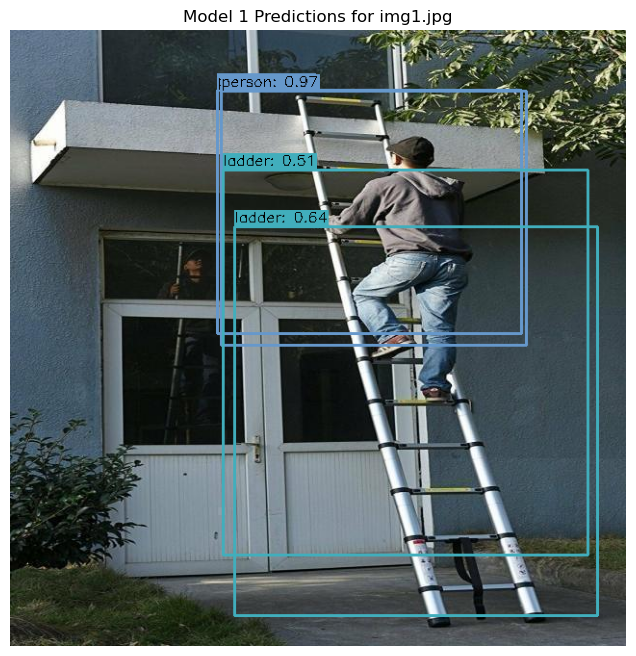

Inference time elapsed: 0.10 seconds


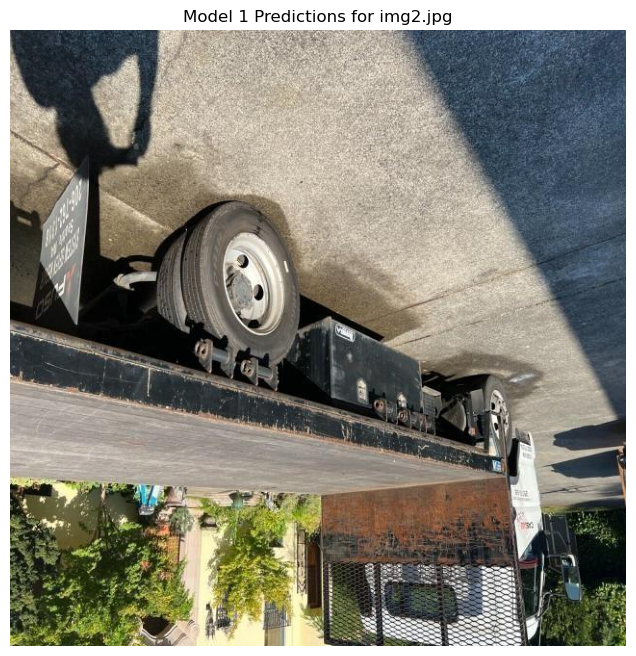

Inference time elapsed: 0.30 seconds


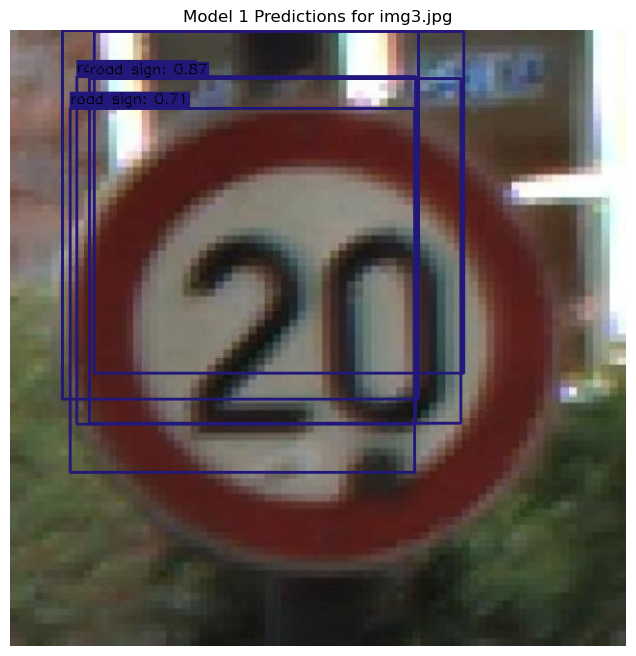

Inference time elapsed: 0.11 seconds


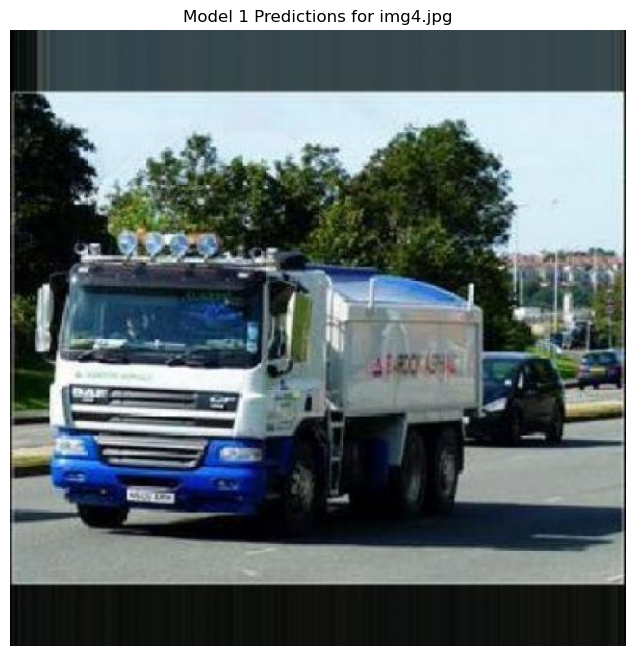

Inference time elapsed: 0.10 seconds


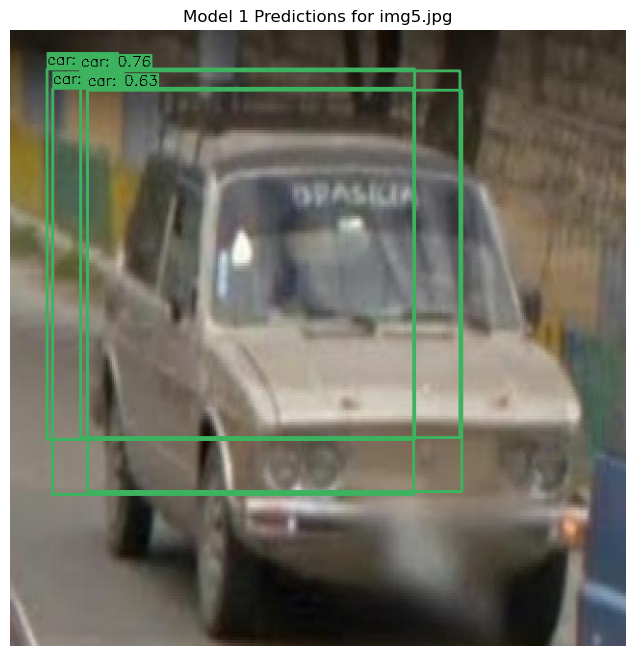

Inference time elapsed: 0.10 seconds


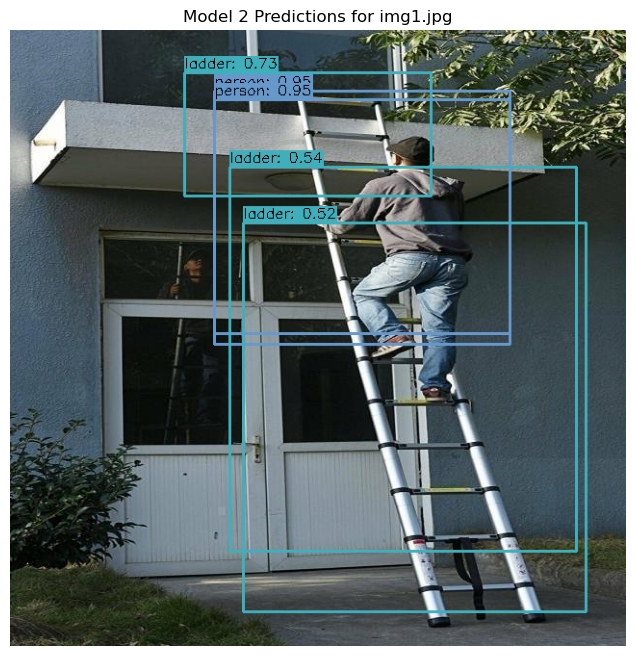

Inference time elapsed: 0.13 seconds


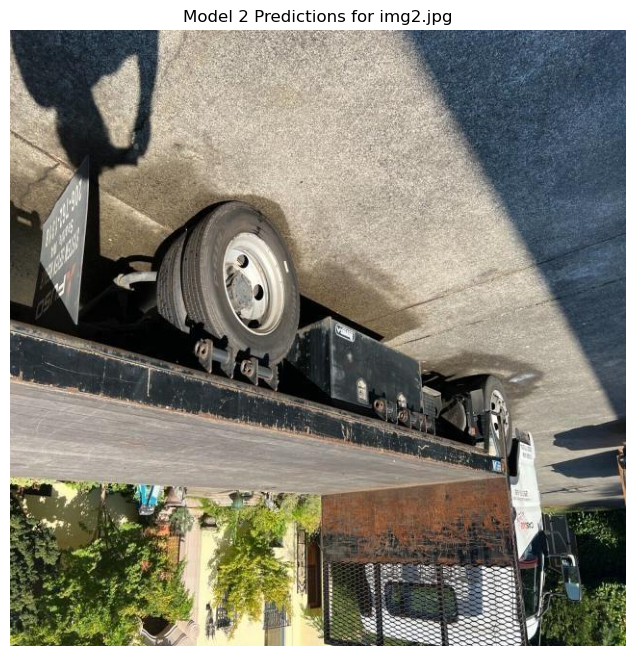

Inference time elapsed: 0.10 seconds


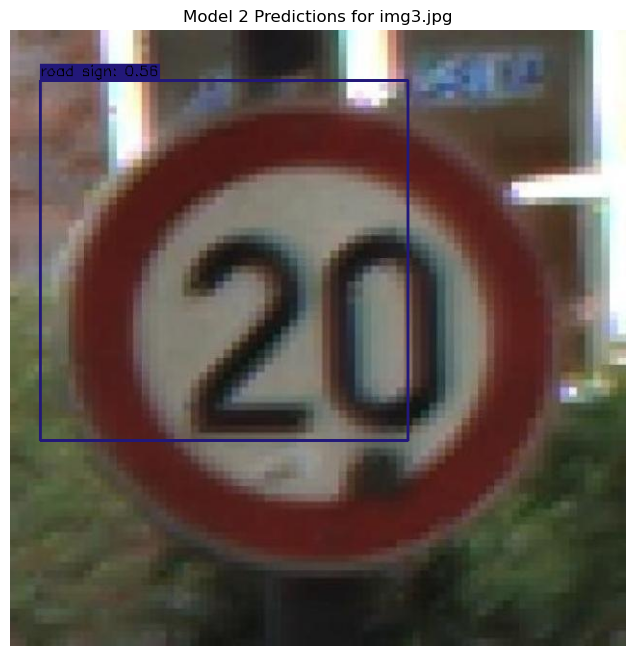

Inference time elapsed: 0.11 seconds


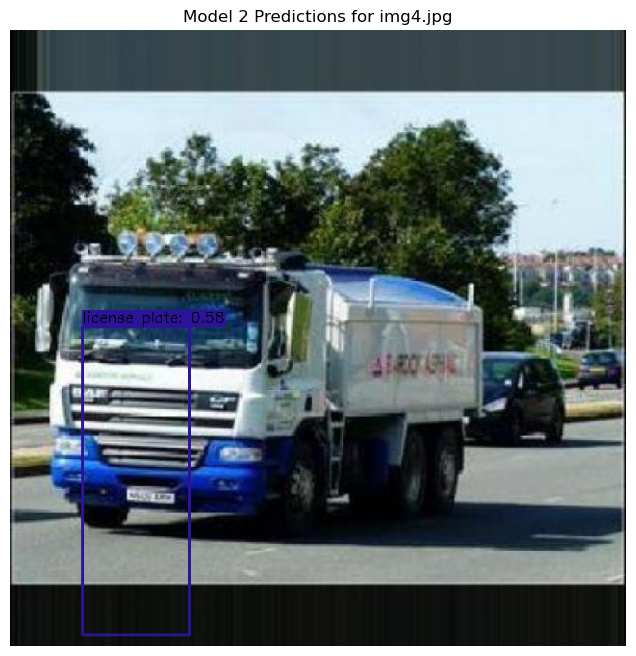

Inference time elapsed: 0.13 seconds


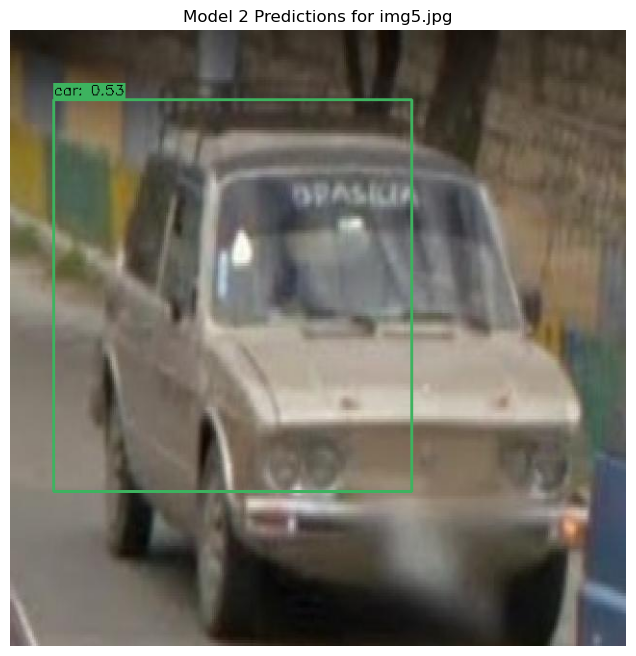

In [2]:
for i, model in enumerate(models, start=1):
    for image_path in images:
        # Read the image
        image = cv.imread(image_path)
    
        # Check if the image is loaded successfully
        if image is None:
            print(f'Error loading image: {image_path}')
            continue
    
        # Preprocess the image and predict the output
        preprocessed_frame, original_frame = model.preprocess(image)
        bboxes, class_ids, scores = model.predict(preprocessed_frame)
    
        # Post-process the outputs to get bounding boxes, class IDs, and scores
        pp_bboxes, pp_class_ids, pp_scores = model.post_process(bboxes, class_ids, scores, original_frame, score_threshold=0.5)
    
        # Draw bounding boxes on the original image
        image_with_boxes = model.draw_bboxes(original_frame.copy(), pp_bboxes, pp_class_ids, pp_scores)
    
        # Convert BGR image to RGB for displaying with matplotlib
        image_rgb = cv.cvtColor(image_with_boxes, cv.COLOR_BGR2RGB)
    
        # Display the image with bounding boxes
        plt.figure(figsize=(10, 8))
        plt.imshow(image_rgb)
        plt.title(f"Model {i} Predictions for {image_path}")
        plt.axis('off')
        plt.show()

- `inference.nms.filter()`
    - Show the nms-filtered bounding box predictions overlaid over the original five images.

Inference time elapsed: 0.11 seconds


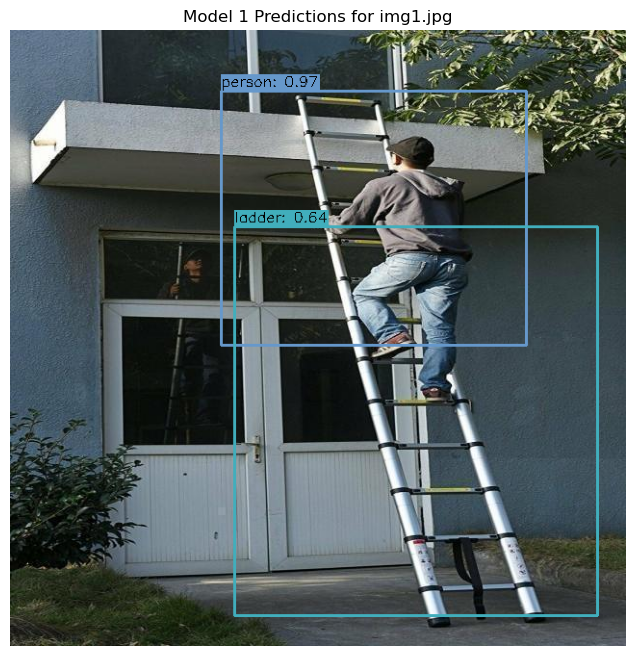

Inference time elapsed: 0.12 seconds


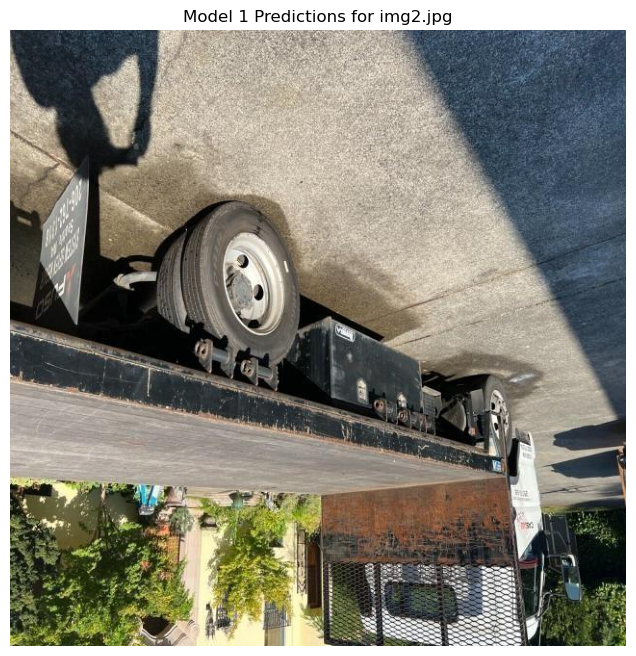

Inference time elapsed: 0.13 seconds


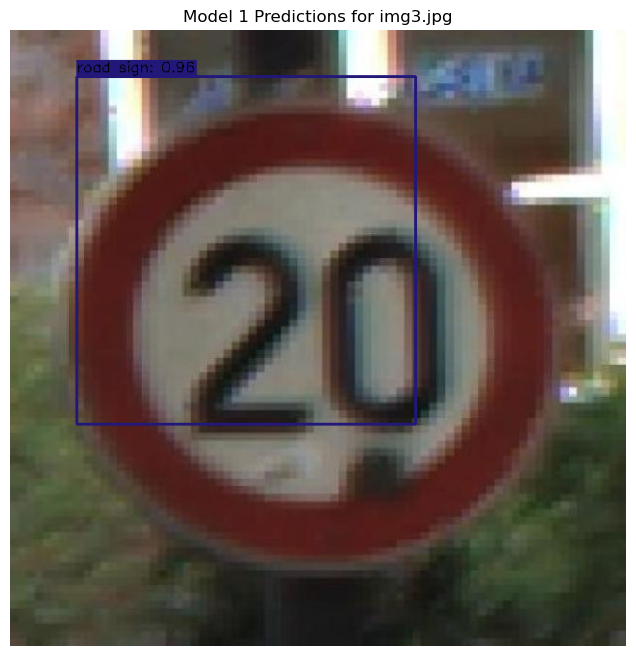

Inference time elapsed: 0.12 seconds


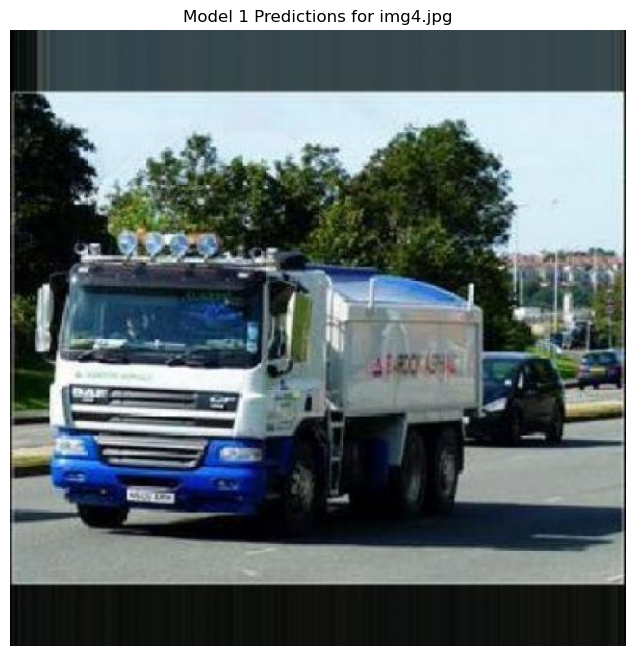

Inference time elapsed: 0.14 seconds


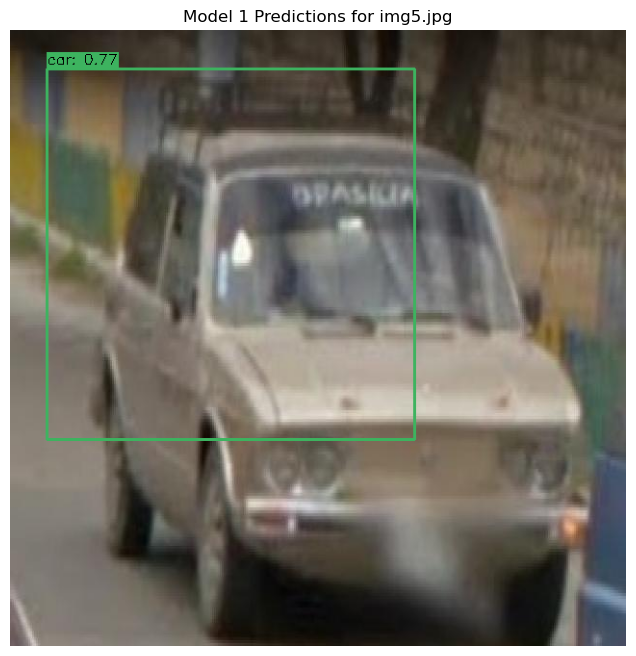

Inference time elapsed: 0.13 seconds


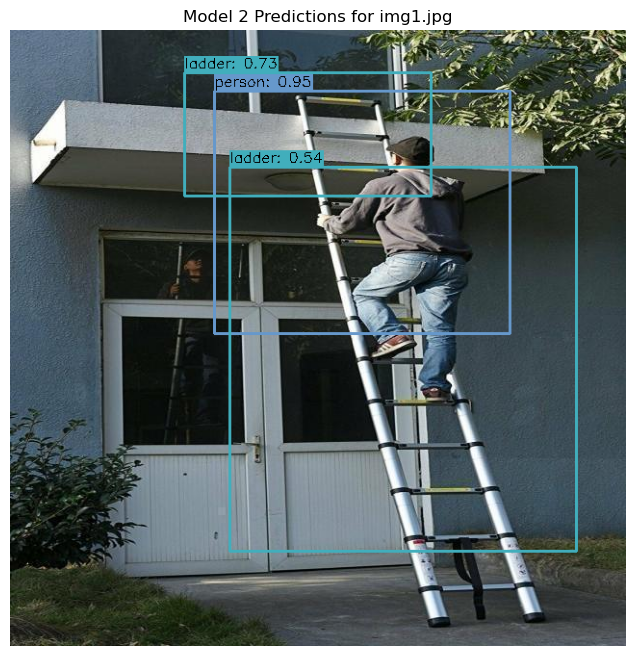

Inference time elapsed: 0.14 seconds


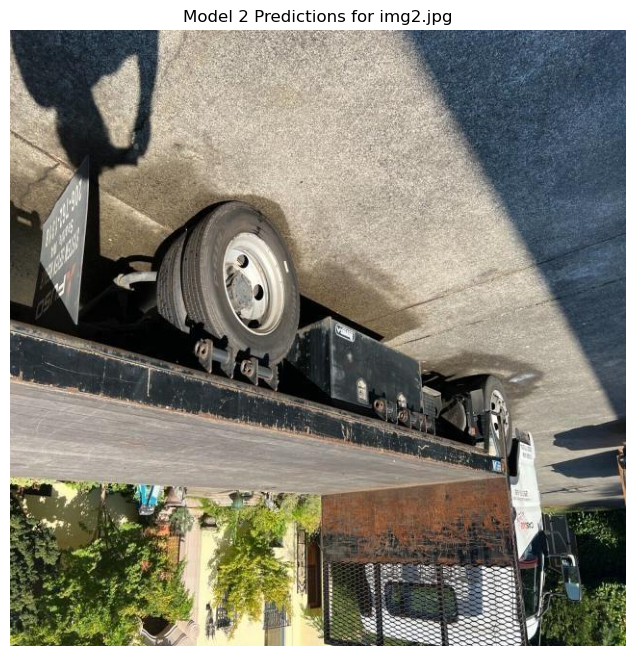

Inference time elapsed: 0.10 seconds


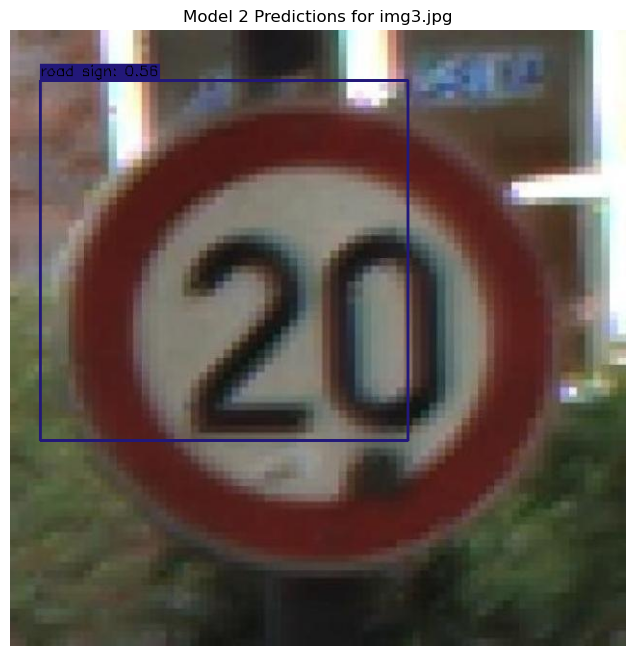

Inference time elapsed: 0.11 seconds


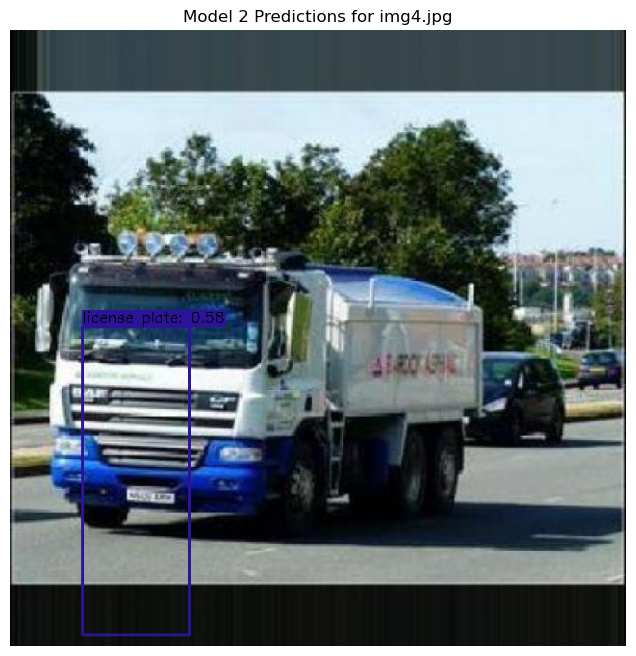

Inference time elapsed: 0.16 seconds


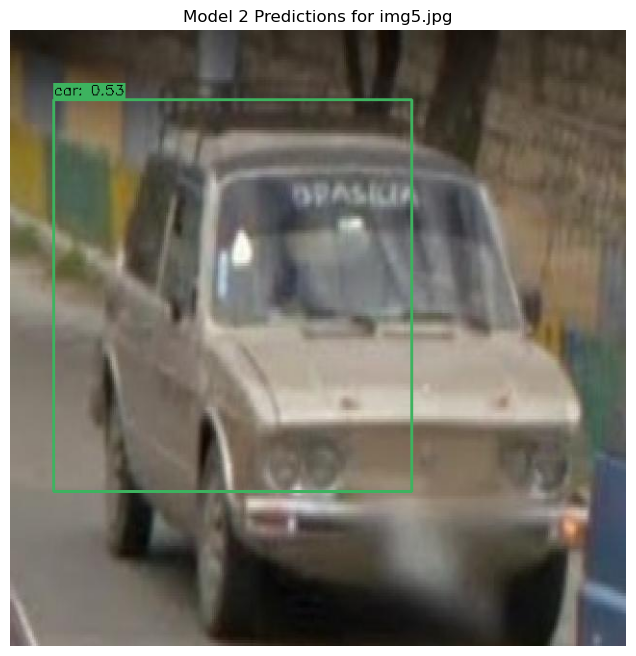

In [3]:
for i, model in enumerate(models, start=1):
    for image_path in images:
        # Read the image
        image = cv.imread(image_path)
    
        # Check if the image is loaded successfully
        if image is None:
            print(f'Error loading image: {image_path}')
            continue
    
        # Preprocess the image and predict the output
        preprocessed_frame, original_frame = model.preprocess(image)
        bboxes, class_ids, scores = model.predict(preprocessed_frame)
    
        # Post-process the outputs to get bounding boxes, class IDs, and scores
        pp_bboxes, pp_class_ids, pp_scores = model.post_process(bboxes, class_ids, scores, original_frame, score_threshold=0.5)

        # Apply NMS to post-processed outputs
        nms_bboxes, nms_class_ids, nms_labels, nms_scores = filter(pp_bboxes, pp_class_ids, pp_scores, score_threshold=0.5, nms_iou_threshold=0.4)
    
        # Draw bounding boxes on the original image
        image_with_boxes = model.draw_bboxes(original_frame.copy(), nms_bboxes, nms_class_ids, nms_scores)
    
        # Convert BGR image to RGB for displaying with matplotlib
        image_rgb = cv.cvtColor(image_with_boxes, cv.COLOR_BGR2RGB)
    
        # Display the image with bounding boxes
        plt.figure(figsize=(10, 8))
        plt.imshow(image_rgb)
        plt.title(f"Model {i} Predictions for {image_path}")
        plt.axis('off')
        plt.show()